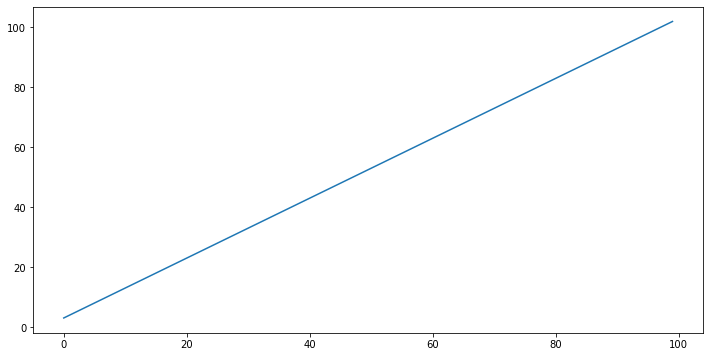

array([  3,   4,   5,   6,   7,   8,   9,  10,  11,  12,  13,  14,  15,
        16,  17,  18,  19,  20,  21,  22,  23,  24,  25,  26,  27,  28,
        29,  30,  31,  32,  33,  34,  35,  36,  37,  38,  39,  40,  41,
        42,  43,  44,  45,  46,  47,  48,  49,  50,  51,  52,  53,  54,
        55,  56,  57,  58,  59,  60,  61,  62,  63,  64,  65,  66,  67,
        68,  69,  70,  71,  72,  73,  74,  75,  76,  77,  78,  79,  80,
        81,  82,  83,  84,  85,  86,  87,  88,  89,  90,  91,  92,  93,
        94,  95,  96,  97,  98,  99, 100, 101, 102])

In [1]:
##lineAndRandomPoints
import numpy as np
import matplotlib.pyplot as plt

line = np.array([i + 3 for i in range(100)])
figure = plt.figure(figsize = (12,6))
plt.plot(line)
plt.show()
line

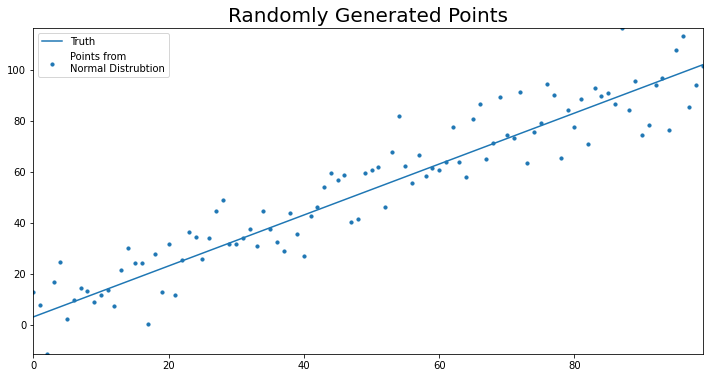

In [2]:
import random

points = []
for point in line:
    points.append(random.normalvariate(point, 10))

figure = plt.figure(figsize = (12, 6))
plt.rcParams["axes.xmargin"] = 0
plt.rcParams["axes.ymargin"] = 0
plt.plot(line, label ="Truth")
plt.scatter(np.arange(len(points)), points, s = 10,
           label = "Points from\nNormal Distrubtion")
plt.title("Randomly Generated Points", fontsize = 20)
plt.legend(loc = "best")
plt.show()

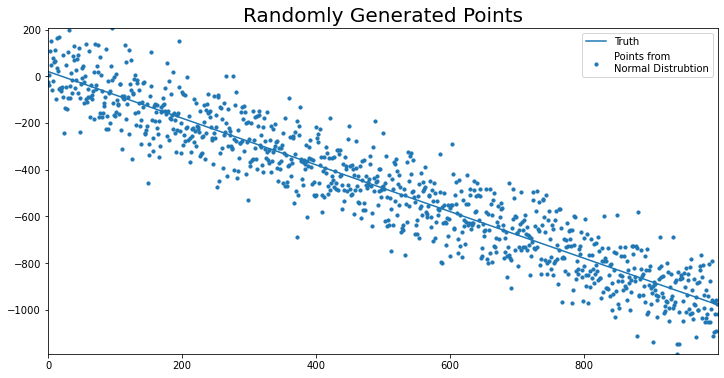

In [3]:
import random

def build_random_data_with_line(y_int, slope, SD = 1, line_length = 100):
    line = np.array([slope * i + y_int for i in range(line_length)])    
    points = []
    for point in line:
        points.append(random.normalvariate(point, SD))
        
    return line, points

def plot_line(line, points, line_name = "Truth",
              title = "Randomly Generated Points"):

    figure = plt.figure(figsize = (12, 6))
    plt.rcParams["axes.xmargin"] = 0
    plt.rcParams["axes.ymargin"] = 0
    plt.plot(line, label =line_name)
    plt.scatter(np.arange(len(points)), points, s = 10,
               label = "Points from\nNormal Distrubtion")
    plt.title("Randomly Generated Points", fontsize = 20)
    plt.legend(loc = "best")
    plt.show()
    
line, points = build_random_data_with_line(y_int = 20, slope = -1, SD = 100, line_length = 1000)
plot_line(line, points)

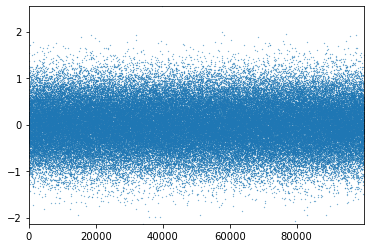

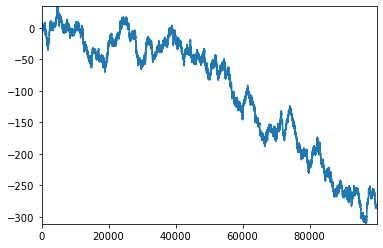

In [4]:
#montecarloSimulation

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import random


mu = 0
#SD is sigma, variance is sigma**2
sigma = .5
random_list = []
observations = 100000
for i in range(100000):
    random_list.append(random.normalvariate(mu, sigma))

plt.plot(random_list, ls = "",linewidth = 1, marker =".", markersize = .5)
plt.show()
plt.close()

simulation = [] 

for i in range(len(random_list)):
    val = random_list[i]
    if i == 0:
        simulation.append(val)
    else:
        simulation.append(simulation[i-1] + val)
        
plt.plot(simulation)
plt.show()
plt.close()


In [5]:
def run_monte_carlo(mean, sigma, num_sims, sim_dict, index):
    
    for i in range(num_sims):
        sim_dict[i] = {}
        for ix in index:
            sim_dict[i][ix] = random.normalvariate(mean, sigma)


In [6]:
mean = 0
sigma = 1
monte_carlo_sim_dict = {}
num_sims = 2000
index = np.arange(2000)
run_monte_carlo(mean, sigma, num_sims, monte_carlo_sim_dict, index)
        
monte_carlo_sim_df = (pd.DataFrame(monte_carlo_sim_dict))
        
monte_carlo_sim_df

,0,1,2,3,4,5,6,7,8,9,...,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999
0,1.071202,-0.481517,0.297000,-2.195786,0.244580,0.147608,0.061359,0.715135,-0.647926,0.222056,...,-0.655099,-1.387792,1.458992,-1.011101,0.059032,2.234461,0.152522,-2.031650,0.695943,-0.503697
1,0.403625,1.740873,0.657794,-1.019986,-0.074731,0.335411,-0.145523,1.608899,0.520917,-0.545466,...,0.093351,-0.560204,-0.683602,-1.088361,0.414116,-1.184663,0.716427,-1.202059,0.526469,1.970737
2,1.034815,0.711904,-0.240139,0.101940,0.740082,-1.100425,1.841579,0.335483,0.799020,-1.241026,...,1.034199,0.293347,-1.032108,0.595331,-1.472363,0.585528,-2.262277,-1.083815,0.231976,1.418073
3,-0.063941,0.911788,1.223012,1.606307,0.032246,-0.573619,0.498696,0.820540,1.968509,-0.696873,...,-1.919958,-1.045712,0.424620,0.683448,-0.541637,0.811086,-0.542501,0.327616,0.873913,-0.683788
4,0.390925,0.655466,-1.193580,-0.695257,-1.906021,0.917291,0.466649,-1.717227,-1.270755,0.427397,...,0.127827,-0.797697,0.237013,-0.328016,0.385979,2.151839,-0.013577,2.327347,1.077860,-2.325475
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,0.858202,0.211802,0.623971,-0.483889,0.012377,2.138893,-0.808722,-1.172094,-0.736808,0.686192,...,0.101693,0.742865,0.297392,0.229335,-1.083887,-1.478977,0.348518,0.281190,-0.431801,-0.586111
1996,-0.435102,-0.611198,-0.435462,0.364673,-0.867131,-0.200597,0.089918,0.174322,-0.419140,-2.653234,...,0.963158,-0.621427,-0.267180,2.360256,0.004879,0.194820,-0.938234,-0.259317,-0.770402,0.224472
1997,-0.177225,-0.117933,-1.009609,-0.407010,-1.411331,-0.762196,1.514565,0.720476,0.427279,0.039410,...,-1.974118,-1.021501,0.333081,-0.308491,-0.415122,1.453428,-0.317893,-0.539215,0.450272,-0.631545
1998,-0.391172,0.412142,0.545274,-0.811522,1.696476,1.169709,1.745232,-1.192107,-1.129461,1.960274,...,0.328162,-0.695778,1.034715,0.667314,2.083599,0.304309,-0.005201,0.789813,-0.259672,-1.151817


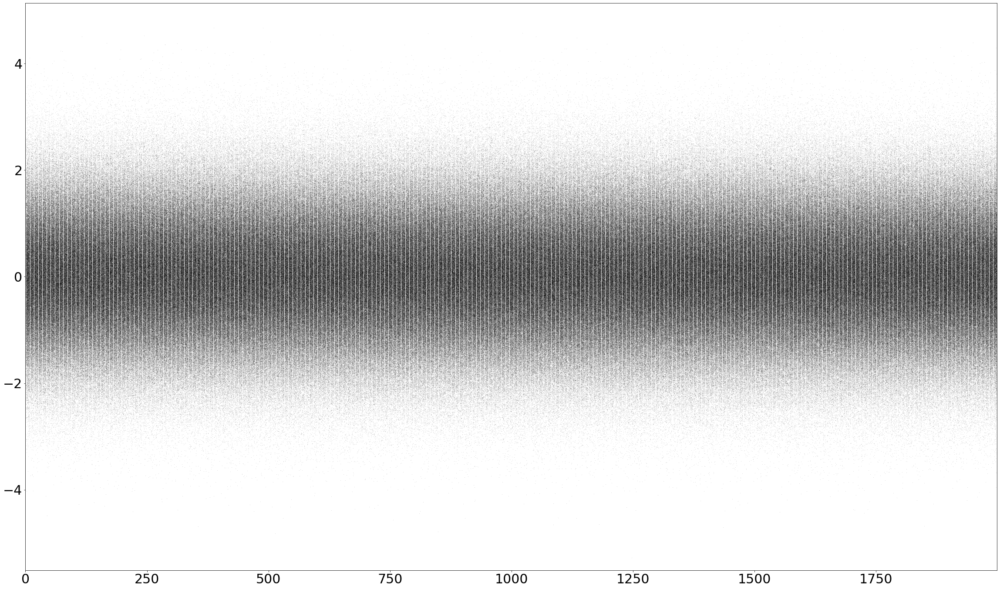

In [7]:
plt.rcParams["axes.xmargin"] = 0
plt.rcParams["axes.ymargin"] = 0
plt.rcParams["font.size"] = 30

fig, ax = plt.subplots(figsize = (40, 24))
monte_carlo_sim_df.plot.line(legend = False, ls = " ", marker=".", markersize = .2, 
                            color ="k", alpha = .5, ax = ax)

plt.show()

<ipython-input-8-d93dfd6ebd52>:7: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([str(int(y * 100)) + "%" for y in y_vals])


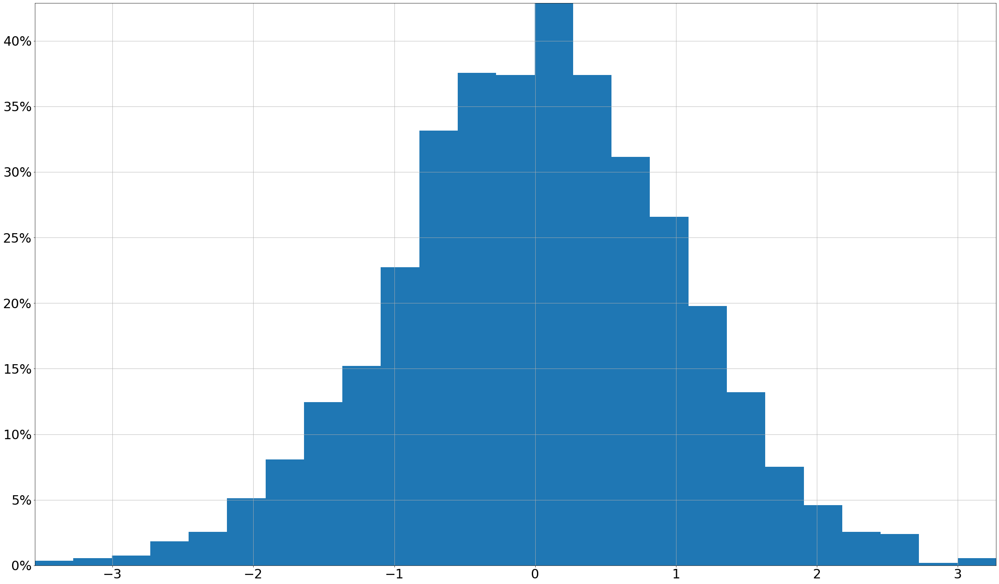

In [8]:
fig, ax = plt.subplots(figsize = (40, 24))
monte_carlo_sim_df.iloc[-1].hist(bins = 25, density = True,
                                ax = ax)

# set vertical axis values as percent
y_vals = ax.get_yticks()
ax.set_yticklabels([str(int(y * 100)) + "%" for y in y_vals])
plt.show()
plt.close()

## Monte Carlo with a Positive Trend

In [12]:
mean = .05 #play around with the parameters
sigma = .5
monte_carlo_sim_dict = {}
num_sims = 2000
periods = 2000
index = np.arange(periods)
run_monte_carlo(mean, sigma, num_sims, monte_carlo_sim_dict, index)
pd.DataFrame

In [13]:
monte_carlo_sim_df = pd.DataFrame(monte_carlo_sim_dict).cumsum() 
#we are gonna take cumulative sum
monte_carlo_sim_df

,0,1,2,3,4,5,6,7,8,9,...,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999
0,-0.741627,-0.173485,-0.393791,-0.427257,-0.778810,1.043508,-0.982317,0.698226,-0.516043,0.164606,...,0.467623,-0.337762,1.828519,-1.229480,-0.581961,-0.107387,0.829464,-0.675655,0.574362,-0.276088
1,-0.552719,-0.043958,-1.753071,-0.177437,-0.795966,0.694068,-1.249499,0.505576,-0.178416,0.540832,...,0.083194,-0.157137,0.851772,-1.529692,-1.196683,1.129178,1.470305,-1.677783,0.382389,0.741784
2,-0.497625,-0.857040,-1.697960,0.375700,-0.642236,1.133322,-1.090536,0.297033,-0.495827,-0.053030,...,0.184314,-0.639839,0.180917,-2.295038,0.165953,1.470868,1.973043,-1.616034,0.553966,1.298993
3,-0.178527,-1.438108,-1.759206,0.264857,-0.545137,1.371662,-1.609495,0.239858,-0.508518,-0.868691,...,0.839990,-0.986672,0.009191,-2.132957,-0.085414,1.182178,1.863356,-2.031303,0.660902,1.558771
4,0.087484,-0.625771,-1.928268,0.576500,-0.040038,1.679475,-1.554829,0.440966,-1.524805,-0.827021,...,0.954757,-1.140364,0.039360,-1.948476,-0.489206,1.530261,1.282220,-1.361183,0.603237,2.081308
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,129.756425,107.432808,89.363431,95.160835,110.702012,102.110868,94.276307,91.691671,111.660417,82.468084,...,83.735822,80.927626,72.859317,49.612127,128.739806,59.768544,63.807105,126.021779,115.902811,70.051738
1996,129.793536,106.845739,89.646989,94.998920,110.058581,102.899605,93.563875,92.757601,111.193588,82.510744,...,83.461693,81.231813,72.890639,49.434559,128.527044,59.082083,63.627896,126.547215,116.832460,70.485569
1997,130.016952,106.556556,90.076879,94.833402,110.523725,103.089232,93.679307,93.266682,111.801847,82.727415,...,82.740981,82.089583,72.890950,49.268089,129.165188,59.761470,63.931244,126.750448,116.323330,71.575683
1998,129.574737,105.552169,90.003568,95.277234,111.222255,102.693120,93.334524,93.423325,112.027944,82.400454,...,82.725854,82.726773,73.341857,49.041604,128.473004,59.867871,62.783125,126.673800,116.485610,70.953703


First few rows of both dataframes are same.

In [17]:
def plot_monte_carlo_sim(sim_data,  
                         title = None, 
                         logy = True):
    
    sim_data["mean"] = sim_data.mean(axis=1)
    fig, ax = plt.subplots(figsize = (40, 24))
    #plot all the observations except for mean
    #experiment with the parameters
    
    sim_data.drop("mean", inplace = False, axis = 1).plot.line(
            legend=False, marker =".", markersize = .1, color = "k", alpha = .05, logy = logy, ax = ax)
    sim_data["mean"].plot.line(legend = False, color = "C3", linewidth = 5, logy = logy, ax = ax)
    index = list(sim_data.index) 
    
    
    plt.title(title, fontsize = 50)
    plt.show()
    plt.close()
    
    #try changing the alphas to see the difference in outcomes

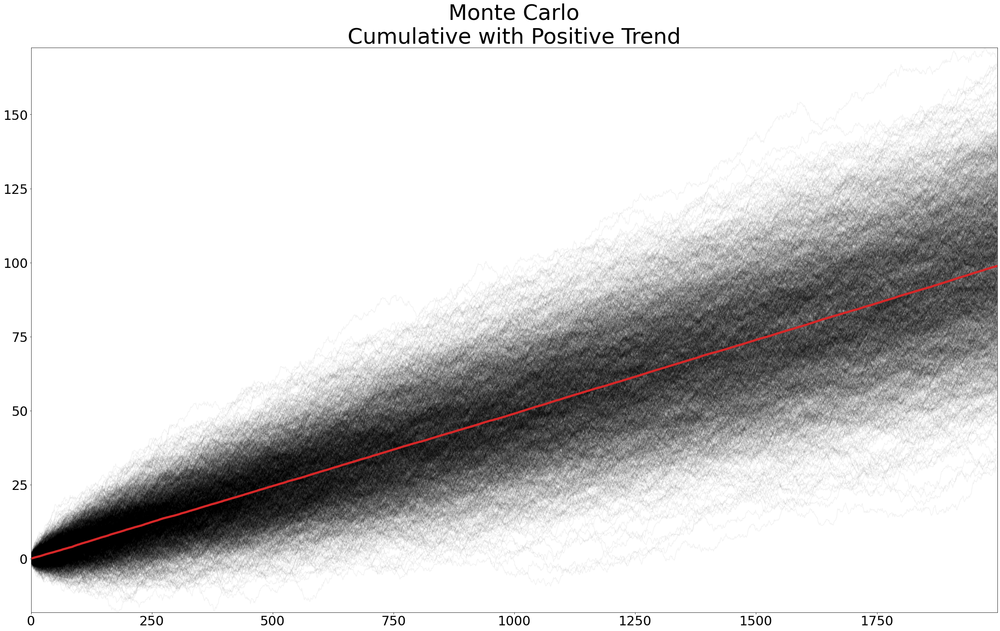

In [18]:
plot_monte_carlo_sim(monte_carlo_sim_df,  
                    title = "Monte Carlo\nCumulative with Positive Trend", 
                    logy = False)


## Calculating Expected Value

In [19]:
monte_carlo_sim_df["mean"] = monte_carlo_sim_df.mean(axis = 1)
monte_carlo_sim_df["mean"]

0        0.036758
1        0.091616
2        0.123773
3        0.176803
4        0.227788
          ...    
1995    98.657744
1996    98.703479
1997    98.747229
1998    98.791378
1999    98.836530
Name: mean, Length: 2000, dtype: float64

## Simulating Changes in Portfolio Values

In [22]:
import pandas_datareader.data as web
import datetime

start = datetime.datetime(2005, 1, 1)
end = datetime.datetime.today()

data_dict = {}
stocks = "MSFT", "AAPL", "IBM", "GOOG"
for name in stocks:
    data_dict[name] = web.DataReader(name, "yahoo", start, end)
data_dict

{'MSFT':                   High         Low        Open       Close       Volume  \
 Date                                                                      
 2005-01-03   26.950001   26.650000   26.799999   26.740000   65002900.0   
 2005-01-04   27.100000   26.660000   26.870001   26.840000  109442100.0   
 2005-01-05   27.100000   26.760000   26.840000   26.780001   72463500.0   
 2005-01-06   27.059999   26.639999   26.850000   26.750000   76890500.0   
 2005-01-07   26.889999   26.620001   26.820000   26.670000   68723300.0   
 ...                ...         ...         ...         ...          ...   
 2021-11-23  339.450012  333.559998  337.049988  337.679993   30427600.0   
 2021-11-24  338.160004  333.910004  336.279999  337.910004   21661300.0   
 2021-11-26  337.929993  328.119995  334.350006  329.679993   24217200.0   
 2021-11-29  339.029999  334.739990  334.940002  336.630005   28534600.0   
 2021-11-30  337.779999  330.559998  335.320007  331.184998   12113340.0   
 
  

In [23]:
# make a list of the close data for each stock
close_data_dict = {key:val["Close"] for key, val in data_dict.items()}
close_data_df = pd.DataFrame(close_data_dict)

In [24]:
close_data_pct_change = close_data_df.pct_change()
close_data_pct_change
#this is the percent change

,MSFT,AAPL,IBM,GOOG
Date,,,,
2005-01-03,NaN,NaN,NaN,NaN
2005-01-04,0.003740,0.010270,-0.010742,-0.040501
2005-01-05,-0.002235,0.008758,-0.002068,-0.005090
2005-01-06,-0.001120,0.000775,-0.003109,-0.025632
2005-01-07,-0.002991,0.072811,-0.004366,0.028109
...,...,...,...,...
2021-11-23,-0.006327,0.002422,0.002747,-0.002186
2021-11-24,0.000681,0.003284,-0.000514,-0.000269
2021-11-26,-0.024356,-0.031678,-0.007881,-0.026660


In [25]:
close_data_normalized = close_data_pct_change.add(1).cumprod()
close_data_normalized.fillna(1, inplace =True)
close_data_normalized

,MSFT,AAPL,IBM,GOOG
Date,,,,
2005-01-03,1.000000,1.000000,1.000000,1.000000
2005-01-04,1.003740,1.010270,0.989258,0.959499
2005-01-05,1.001496,1.019118,0.987212,0.954615
2005-01-06,1.000374,1.019908,0.984143,0.930146
2005-01-07,0.997382,1.094169,0.979847,0.956292
...,...,...,...,...
2021-11-23,12.628272,142.818082,1.249743,29.067549
2021-11-24,12.636874,143.287033,1.249101,29.059728
2021-11-26,12.329095,138.747925,1.239256,28.284993


IBM had a less than steller outcome.
Apple did great.

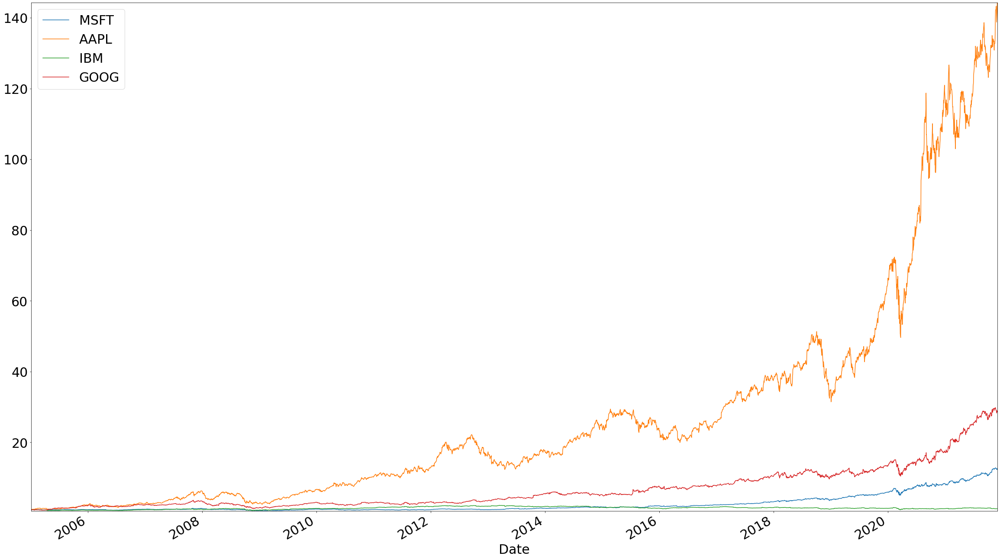

In [31]:
fig, ax = plt.subplots(figsize=(40,24))
close_data_normalized.plot.line(
                                ax = ax)
plt.show()
plt.close()

### Daily Rate of Return

Derive the daily rate of return from the present value equation.

>$PV = \frac{FV}{(1 + r)^t}$
>
>Overall rate of return: $R=\frac{FV}{PV}$

Discount the overall rate of return to find the average rate of return. We will use this to define the mean of the standard normal distribution:

>$ r = (R)^{\frac{1}{t}} - 1$
>
>$t$ is measured in days

In [38]:
FV
PV


NameError: name 'FV' is not defined

In [34]:
## we will calculate mean using this equation

mean_var_df = pd.DataFrame({"mean": close_data_normalized.iloc[-1].div(close_data_normalized.iloc[0]) ** (
                                1 / close_data_normalized["MSFT"].count()) - 1, 
                            "sigma" : close_data_pct_change.std()})
mean_var_df

,mean,sigma
MSFT,0.000591,0.017059
AAPL,0.001168,0.020769
IBM,0.000055,0.014587
GOOG,0.000788,0.018617


In [36]:
num_sims = 500
dates = list(close_data_df.index)
monte_carlo_sim_dict = {}
for stock in stocks:
    monte_carlo_sim_dict[stock] = {}
    mean = mean_var_df["mean"][stock]
    sigma = mean_var_df["sigma"][stock]   
    run_monte_carlo(mean, sigma, num_sims, monte_carlo_sim_dict[stock], dates)
#    monte_carlo_sim_dict[stock] = pd.DataFrame(monte_carlo_sim_dict[stock]).add(1).cumprod()
monte_carlo_sim_dfs = {stock: pd.DataFrame(monte_carlo_sim_dict[stock]).add(1).cumprod() for stock in stocks}

In [37]:
monte_carlo_sim_dfs

{'MSFT':                  0         1         2          3         4          5    \
 2005-01-03  1.003530  1.019033  0.999680   0.987994  1.026429   1.025362   
 2005-01-04  1.060654  1.009330  1.001017   0.982850  1.055521   1.018708   
 2005-01-05  1.072092  1.019596  0.998242   0.974286  1.058237   1.043202   
 2005-01-06  1.062557  1.037471  0.985781   0.971613  1.032950   1.024695   
 2005-01-07  1.058568  1.054566  0.995021   0.968248  0.988749   1.026518   
 ...              ...       ...       ...        ...       ...        ...   
 2021-11-23  1.781917  2.149362  3.233839  11.267091  3.638356  11.860234   
 2021-11-24  1.774251  2.131016  3.364421  11.528440  3.625430  12.043437   
 2021-11-26  1.799613  2.073896  3.362867  11.686703  3.628987  12.245943   
 2021-11-29  1.816864  2.121067  3.398314  11.590747  3.639505  12.522935   
 2021-11-30  1.777067  2.063603  3.322476  11.627635  3.694667  12.715778   
 
                   6         7         8         9    ...        4

In [39]:
def plot_monte_carlo_sim(sim_data, observed_data = None, title = None, logy = True):
    sim_data["mean"] = sim_data.mean(axis=1)    
    index = sim_data.index
    fig, ax = plt.subplots(figsize = (40, 24))
    sim_data.drop(["mean"], inplace = False, axis = 1).plot.line(
            legend=False, marker =".", markersize = .1, color = "k", alpha = .05, logy = logy, ax = ax)
    if observed_data is not None:
        observed_data.plot.line(legend = False, color = "C2", linewidth = 5, logy = logy, ax = ax)
    
        # find x coordinate of lowest value observed
        obs_text_x = observed_data[observed_data == observed_data.min()].index
        plt.text(obs_text_x, observed_data.loc[obs_text_x] * .7,
                 "Observed", fontsize = 70, color = "C2")
    sim_data["mean"].plot.line(legend = False, color = "C3", 
                               linewidth = 5, logy = logy, ax = ax)
    plt.text(index[-400], sim_data["mean"].iloc[-400] * 1.5, "Exp\nVal",
            fontsize = 70, color = "C3")
   
    
    
    plt.title(title, fontsize = 50)
    plt.show()
    plt.close()

In [40]:
monte_carlo_sim_dfs[stock].median(axis = 1)

2005-01-03     1.001193
2005-01-04     1.002977
2005-01-05     1.002681
2005-01-06     1.003964
2005-01-07     1.007938
                ...    
2021-11-23    13.342473
2021-11-24    13.360111
2021-11-26    13.236703
2021-11-29    13.340535
2021-11-30    13.361251
Length: 4258, dtype: float64

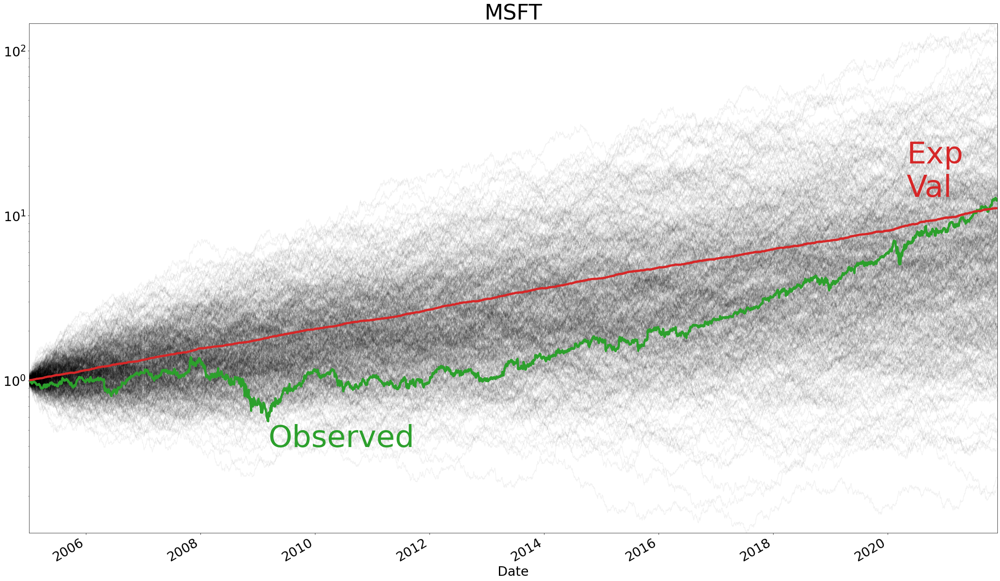

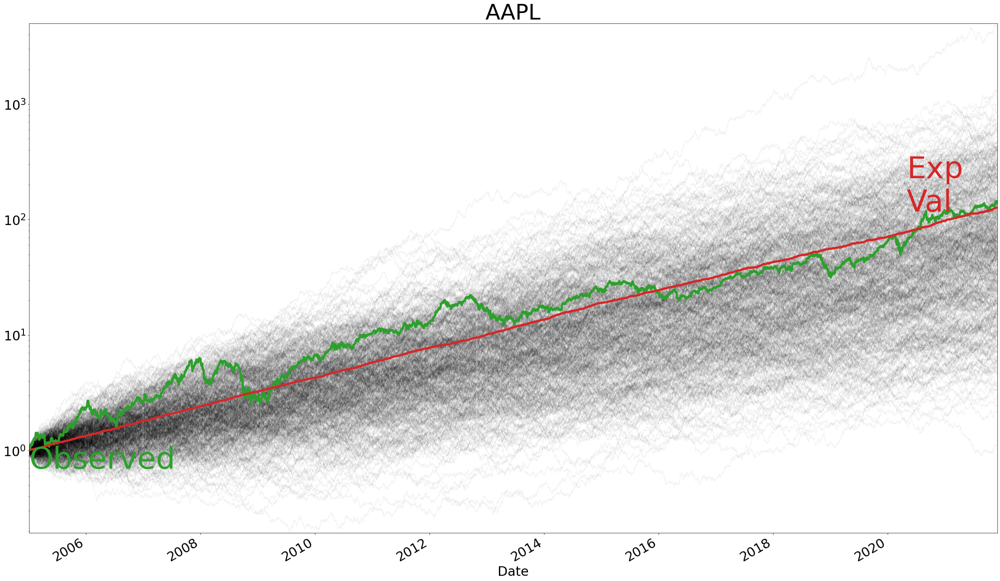

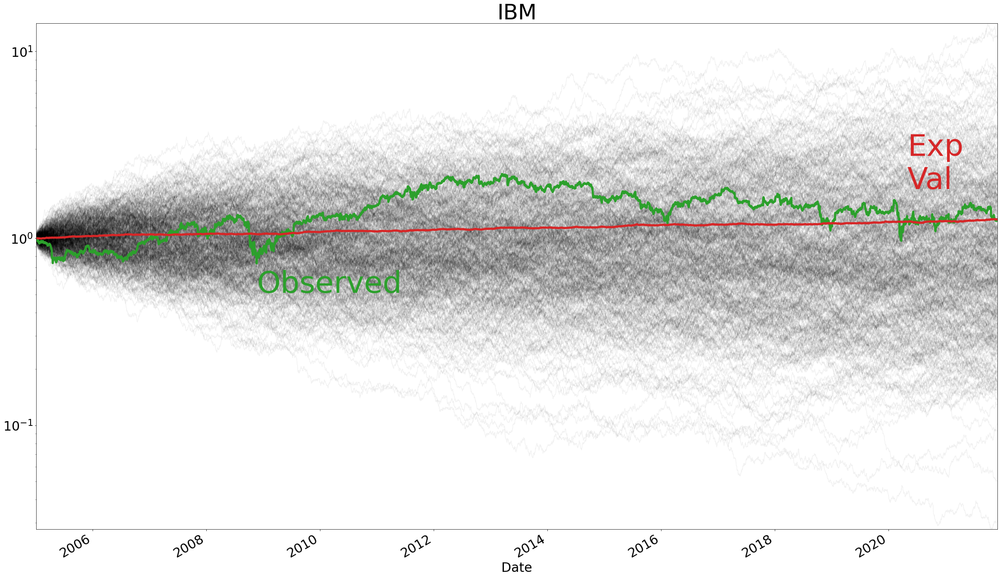

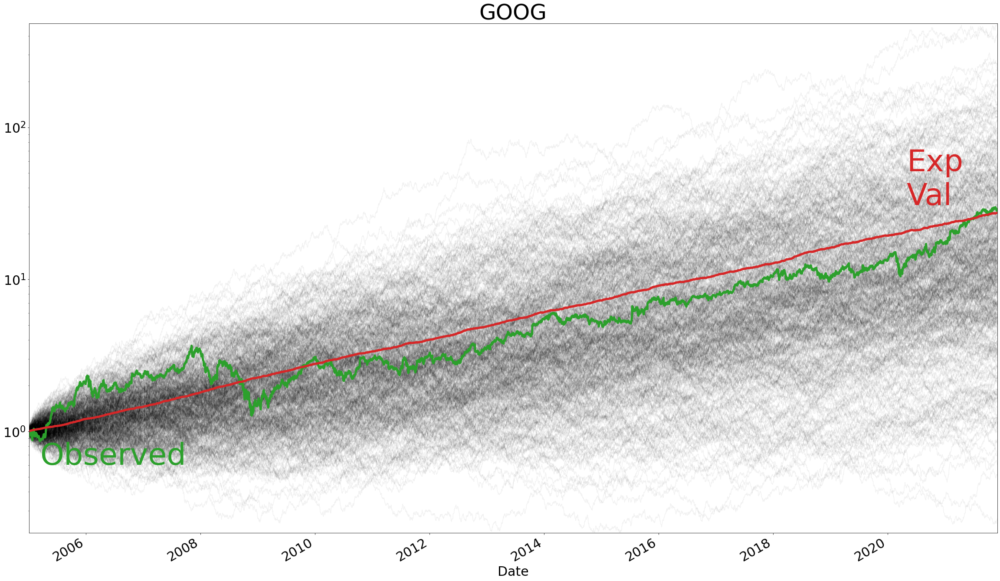

In [41]:
for stock in stocks:
    plot_monte_carlo_sim(monte_carlo_sim_dfs[stock], close_data_normalized[stock], stock, logy= True)
